## Setup and Environment

Install dependencies

In [1]:
!pip install -q datasets transformers
!pip install -q opencv-python-headless
!pip install -q scikit-image
!pip install -q grad-cam
!pip install -q seaborn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 94.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


Import libraries

In [2]:
import os
import random
import numpy as np
import pandas as pd
from collections import defaultdict, Counter
from tqdm.auto import tqdm
import warnings
warnings.filterwarnings('ignore')

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

# Computer Vision
import cv2
from skimage.feature import graycomatrix, graycoprops
from skimage import color, filters

# Deep Learning
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, Subset
import torchvision
from torchvision import transforms, models

# HuggingFace
from datasets import load_dataset

# Set plotting style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

Set random seeds and device

In [3]:
def set_seed(seed=42):
    """Set random seeds for reproducibility"""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

# Check for GPU availability
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"Memory Allocated: {torch.cuda.memory_allocated(0) / 1024**3:.2f} GB")
    print(f"Memory Cached: {torch.cuda.memory_reserved(0) / 1024**3:.2f} GB")
else:
    print("Warning: No GPU detected. Training will be slower on CPU.")

Device: cuda
GPU: Tesla T4
Memory Allocated: 0.00 GB
Memory Cached: 0.00 GB


## Dataloading and Preparation


Load HuggingFace data

In [4]:
ds = load_dataset("eong/20k-Album-Covers-within-20-Genres")

# Extract label-to-genre mapping from dataset features
label_feature = ds['train'].features['label']
label_to_genre = {i: name for i, name in enumerate(label_feature.names)}
genre_to_label_original = {name: i for i, name in label_to_genre.items()}

print(f"LABEL TO GENRE MAPPING:")
for label_idx, genre_name in sorted(label_to_genre.items()):
    print(f"  {label_idx:>2} : {genre_name}")
print(f"{'='*60}\n")

# Count examples per genre
all_labels = [example['label'] for example in ds['train']]
label_counts = Counter(all_labels)

print(f"GENRE DISTRIBUTION:")
for label_idx in sorted(label_counts.keys()):
    genre_name = label_to_genre[label_idx]
    count = label_counts[label_idx]
    print(f"  {genre_name:<20} : {count:>4} images")

README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00001-f37f5042abc5be(…):   0%|          | 0.00/237M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/20000 [00:00<?, ? examples/s]

LABEL TO GENRE MAPPING:
   0 : Blues
   1 : Classical
   2 : Country
   3 : DeathMetal
   4 : DoomMetal
   5 : DrumNBass
   6 : Electronic
   7 : Folk
   8 : Grime
   9 : HeavyMetal
  10 : HipHop
  11 : Jazz
  12 : LoFi
  13 : Pop
  14 : PsychedelicRock
  15 : Punk
  16 : Reggae
  17 : Rock
  18 : Soul
  19 : Techno

GENRE DISTRIBUTION:
  Blues                : 1000 images
  Classical            : 1000 images
  Country              : 1000 images
  DeathMetal           : 1000 images
  DoomMetal            : 1000 images
  DrumNBass            : 1000 images
  Electronic           : 1000 images
  Folk                 : 1000 images
  Grime                : 1000 images
  HeavyMetal           : 1000 images
  HipHop               : 1000 images
  Jazz                 : 1000 images
  LoFi                 : 1000 images
  Pop                  : 1000 images
  PsychedelicRock      : 1000 images
  Punk                 : 1000 images
  Reggae               : 1000 images
  Rock                 : 1000 im

Select genre targets

In [5]:
TARGET_GENRES = ['HipHop', 'Rock', 'Pop', 'Electronic']
IMAGES_PER_GENRE = 800

print(f"Target genres selected: {TARGET_GENRES}")
print(f"Images per genre: {IMAGES_PER_GENRE}\n")

# Create new mapping for our 4-class problem
genre_to_idx = {genre: i for i, genre in enumerate(TARGET_GENRES)}
idx_to_genre = {i: genre for genre, i in genre_to_idx.items()}

print(f"New 4-class mapping:")
for genre, idx in genre_to_idx.items():
    print(f"  {idx}: {genre}")
print()

# Collect indices for each target genre
genre_indices = {genre: [] for genre in TARGET_GENRES}

for idx, example in enumerate(tqdm(ds['train'], desc="Filtering genres")):
    label = example['label']
    genre_name = label_to_genre[label]

    if genre_name in TARGET_GENRES:
        genre_indices[genre_name].append(idx)

# Balance dataset
balanced_indices = []
for genre in TARGET_GENRES:
    available = len(genre_indices[genre])
    print(f"{genre}: {available} images available")

    if available < IMAGES_PER_GENRE:
        print(f"Warning: {genre} has only {available} images (wanted {IMAGES_PER_GENRE})")
        # Use all available
        balanced_indices.extend(genre_indices[genre])
    else:
        # Random sample
        sampled = random.sample(genre_indices[genre], IMAGES_PER_GENRE)
        balanced_indices.extend(sampled)

# Shuffle the balanced indices
random.shuffle(balanced_indices)

print(f"\nBalanced dataset created:")
print(f"  Total images: {len(balanced_indices)}")
for genre in TARGET_GENRES:
    count = sum(1 for idx in balanced_indices if label_to_genre[ds['train'][idx]['label']] == genre)
    print(f"  {genre}: {count} images")

Target genres selected: ['HipHop', 'Rock', 'Pop', 'Electronic']
Images per genre: 800

New 4-class mapping:
  0: HipHop
  1: Rock
  2: Pop
  3: Electronic



Filtering genres:   0%|          | 0/20000 [00:00<?, ?it/s]

HipHop: 1000 images available
Rock: 1000 images available
Pop: 1000 images available
Electronic: 1000 images available

Balanced dataset created:
  Total images: 3200
  HipHop: 800 images
  Rock: 800 images
  Pop: 800 images
  Electronic: 800 images


Train, validate, and test data

In [6]:
# Split: 70% train, 15% val, 15% test
total_size = len(balanced_indices)
train_size = int(0.70 * total_size)
val_size = int(0.15 * total_size)
test_size = total_size - train_size - val_size

# Stratified split by genre
train_indices = []
val_indices = []
test_indices = []

for genre in TARGET_GENRES:
    # Get all indices for this genre
    genre_idx = [idx for idx in balanced_indices
                 if label_to_genre[ds['train'][idx]['label']] == genre]

    # Calculate splits for this genre
    n = len(genre_idx)
    n_train = int(0.70 * n)
    n_val = int(0.15 * n)

    # Split
    train_indices.extend(genre_idx[:n_train])
    val_indices.extend(genre_idx[n_train:n_train + n_val])
    test_indices.extend(genre_idx[n_train + n_val:])

# Shuffle each split
random.shuffle(train_indices)
random.shuffle(val_indices)
random.shuffle(test_indices)

print(f"DATASET SPLITS:")
print(f"  Training:   {len(train_indices):>4} images ({len(train_indices)/total_size*100:.1f}%)")
print(f"  Validation: {len(val_indices):>4} images ({len(val_indices)/total_size*100:.1f}%)")
print(f"  Test:       {len(test_indices):>4} images ({len(test_indices)/total_size*100:.1f}%)")
print(f"  Total:      {total_size:>4} images\n")

# Verify stratification
for split_name, split_indices in [('Train', train_indices), ('Val', val_indices), ('Test', test_indices)]:
    print(f"{split_name} split genre distribution:")
    for genre in TARGET_GENRES:
        count = sum(1 for idx in split_indices
                   if label_to_genre[ds['train'][idx]['label']] == genre)
        print(f"  {genre}: {count}")
    print()

DATASET SPLITS:
  Training:   2240 images (70.0%)
  Validation:  480 images (15.0%)
  Test:        480 images (15.0%)
  Total:      3200 images

Train split genre distribution:
  HipHop: 560
  Rock: 560
  Pop: 560
  Electronic: 560

Val split genre distribution:
  HipHop: 120
  Rock: 120
  Pop: 120
  Electronic: 120

Test split genre distribution:
  HipHop: 120
  Rock: 120
  Pop: 120
  Electronic: 120



Create PyTorch dataloader

In [7]:
class AlbumCoverDataset(Dataset):
    """PyTorch Dataset for Album Covers"""

    def __init__(self, hf_dataset, indices, genre_to_idx, label_to_genre, transform=None):
        """
        Args:
            hf_dataset: HuggingFace dataset object
            indices: List of indices to use from the dataset
            genre_to_idx: Dictionary mapping genre names to integer labels (0-3 for our 4 classes)
            label_to_genre: Dictionary mapping original labels to genre names
            transform: torchvision transforms to apply
        """
        self.dataset = hf_dataset
        self.indices = indices
        self.genre_to_idx = genre_to_idx
        self.label_to_genre = label_to_genre
        self.transform = transform

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, idx):
        # Get the actual index in the HF dataset
        actual_idx = self.indices[idx]
        example = self.dataset[actual_idx]

        # Get image and convert to RGB
        image = example['image'].convert('RGB')

        # Get genre name from original label
        original_label = example['label']
        genre = self.label_to_genre[original_label]

        # Convert to our new 4-class label
        label = self.genre_to_idx[genre]

        # Apply transforms
        if self.transform:
            image = self.transform(image)

        return image, label, genre

# Define transforms
IMG_SIZE = 224  # ResNet-18 input size

# Training transforms (with augmentation)
train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # ImageNet stats
                        std=[0.229, 0.224, 0.225])
])

# Validation/Test transforms (no augmentation)
val_test_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225])
])

# Create datasets
train_dataset = AlbumCoverDataset(
    ds['train'], train_indices, genre_to_idx, label_to_genre, train_transform
)
val_dataset = AlbumCoverDataset(
    ds['train'], val_indices, genre_to_idx, label_to_genre, val_test_transform
)
test_dataset = AlbumCoverDataset(
    ds['train'], test_indices, genre_to_idx, label_to_genre, val_test_transform
)

# Create dataloaders
BATCH_SIZE = 32
NUM_WORKERS = 0

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True if torch.cuda.is_available() else False
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True if torch.cuda.is_available() else False
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True if torch.cuda.is_available() else False
)

print(f"\nDataLoader configuration:")
print(f"  Batch size: {BATCH_SIZE}")
print(f"  Train batches: {len(train_loader)}")
print(f"  Val batches: {len(val_loader)}")
print(f"  Test batches: {len(test_loader)}")

# Test loading a batch
images, labels, genres = next(iter(train_loader))
print(f"  Batch image shape: {images.shape}")
print(f"  Batch labels shape: {labels.shape}")
print(f"  Label range: {labels.min().item()} to {labels.max().item()}")


DataLoader configuration:
  Batch size: 32
  Train batches: 70
  Val batches: 15
  Test batches: 15
  Batch image shape: torch.Size([32, 3, 224, 224])
  Batch labels shape: torch.Size([32])
  Label range: 0 to 3


## Data Exploration

Sample images

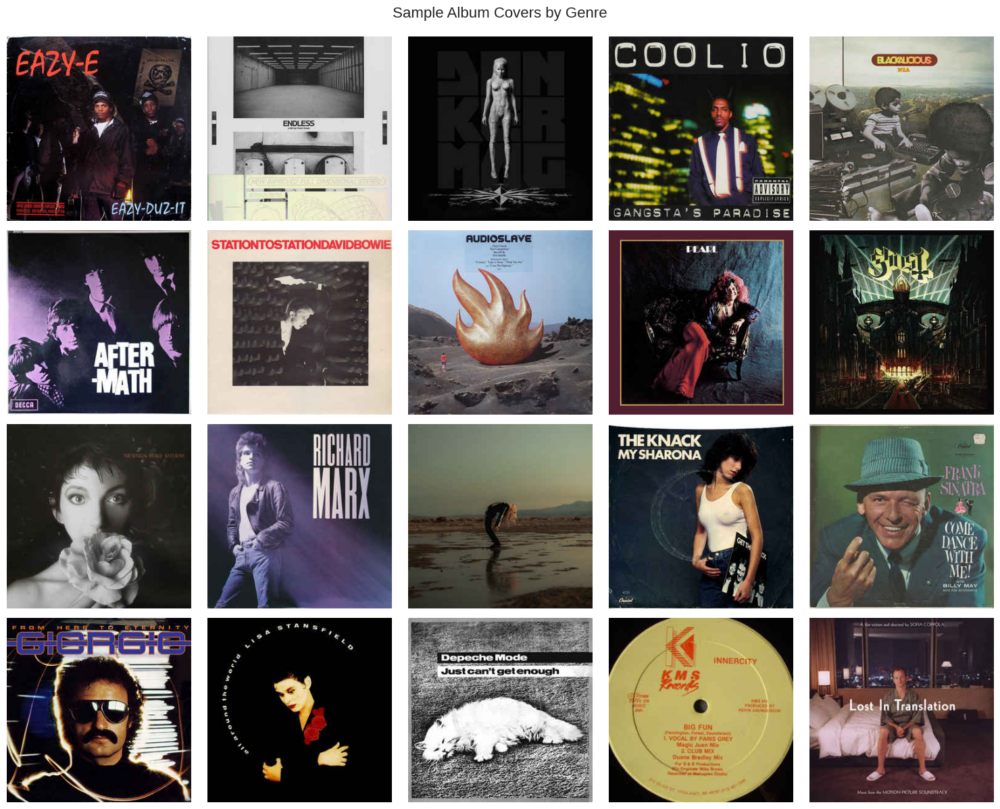

In [8]:
def show_sample_grid(dataset, indices, label_to_genre, n_samples=5):
    """Display grid of sample images per genre"""

    fig, axes = plt.subplots(len(TARGET_GENRES), n_samples, figsize=(15, 12))
    fig.suptitle('Sample Album Covers by Genre', fontsize=16, y=0.995)

    for i, genre in enumerate(TARGET_GENRES):
        # Get indices for this genre
        genre_idx = [idx for idx in indices
                     if label_to_genre[dataset.dataset[idx]['label']] == genre]

        # Sample random images
        sample_idx = random.sample(genre_idx, min(n_samples, len(genre_idx)))

        for j, idx in enumerate(sample_idx):
            example = dataset.dataset[idx]
            img = example['image']

            axes[i, j].imshow(img)
            axes[i, j].axis('off')

            if j == 0:
                axes[i, j].set_ylabel(genre, fontsize=12, rotation=0,
                                     ha='right', va='center')

    plt.tight_layout()
    plt.show()

show_sample_grid(train_dataset, train_indices, label_to_genre, n_samples=5)

Data statistics


DATASET STATISTICS
  Total images: 3200
  Image size: 224x224 (resized)
  Number of genres: 4

Genre distribution across splits:
Split       Test  Train  Val  Total
Genre                              
Electronic   120    560  120    800
HipHop       120    560  120    800
Pop          120    560  120    800
Rock         120    560  120    800


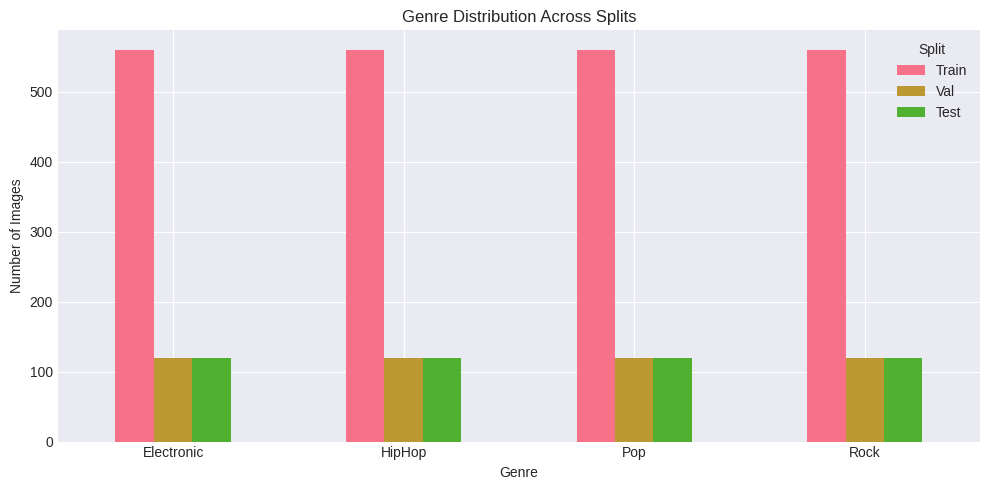

In [9]:
print("\nDATASET STATISTICS")

# Overall stats
print(f"  Total images: {len(balanced_indices)}")
print(f"  Image size: {IMG_SIZE}x{IMG_SIZE} (resized)")
print(f"  Number of genres: {len(TARGET_GENRES)}")

# Genre distribution across splits
genre_stats = []
for split_name, split_indices in [('Train', train_indices),
                                   ('Val', val_indices),
                                   ('Test', test_indices)]:
    for genre in TARGET_GENRES:
        count = sum(1 for idx in split_indices
                   if label_to_genre[ds['train'][idx]['label']] == genre)
        genre_stats.append({
            'Split': split_name,
            'Genre': genre,
            'Count': count
        })

stats_df = pd.DataFrame(genre_stats)
stats_pivot = stats_df.pivot(index='Genre', columns='Split', values='Count')
stats_pivot['Total'] = stats_pivot.sum(axis=1)

print(f"\nGenre distribution across splits:")
print(stats_pivot)

# Visualize distribution
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
stats_pivot[['Train', 'Val', 'Test']].plot(kind='bar', ax=ax, rot=0)
ax.set_title('Genre Distribution Across Splits')
ax.set_xlabel('Genre')
ax.set_ylabel('Number of Images')
ax.legend(title='Split')
plt.tight_layout()
plt.show()

## CV Feature Extraction


Define feature extraction functions

In [10]:
def extract_color_features(image):
    """Extract color-based features from image"""
    # Convert PIL to numpy
    img_array = np.array(image)

    # RGB statistics
    rgb_mean = img_array.mean(axis=(0, 1))
    rgb_std = img_array.std(axis=(0, 1))

    # Convert to HSV
    img_hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)
    hsv_mean = img_hsv.mean(axis=(0, 1))
    hsv_std = img_hsv.std(axis=(0, 1))

    # Color variance (overall colorfulness)
    rg = img_array[:, :, 0] - img_array[:, :, 1]
    yb = 0.5 * (img_array[:, :, 0] + img_array[:, :, 1]) - img_array[:, :, 2]
    color_variance = np.sqrt(np.std(rg)**2 + np.std(yb)**2)

    # Dominant colors (simplified - average of top/bottom quartiles)
    flat_img = img_array.reshape(-1, 3)
    brightness = flat_img.mean(axis=1)
    dark_ratio = (brightness < 64).sum() / len(brightness)
    bright_ratio = (brightness > 192).sum() / len(brightness)

    return {
        'rgb_mean_r': rgb_mean[0],
        'rgb_mean_g': rgb_mean[1],
        'rgb_mean_b': rgb_mean[2],
        'rgb_std_r': rgb_std[0],
        'rgb_std_g': rgb_std[1],
        'rgb_std_b': rgb_std[2],
        'hsv_mean_h': hsv_mean[0],
        'hsv_mean_s': hsv_mean[1],
        'hsv_mean_v': hsv_mean[2],
        'color_variance': color_variance,
        'dark_ratio': dark_ratio,
        'bright_ratio': bright_ratio
    }

def extract_edge_texture_features(image):
    """Extract edge and texture features"""
    # Convert to grayscale
    img_gray = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2GRAY)

    # Edge detection - Canny
    edges = cv2.Canny(img_gray, 100, 200)
    edge_density = edges.sum() / (edges.shape[0] * edges.shape[1] * 255)

    # Sobel gradients
    sobelx = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = np.sqrt(sobelx**2 + sobely**2).mean()

    # Texture - GLCM (Gray Level Co-occurrence Matrix)
    # Downsample for speed
    img_small = cv2.resize(img_gray, (100, 100))
    glcm = graycomatrix(img_small, [1], [0, np.pi/4, np.pi/2, 3*np.pi/4],
                        levels=256, symmetric=True, normed=True)

    contrast = graycoprops(glcm, 'contrast').mean()
    dissimilarity = graycoprops(glcm, 'dissimilarity').mean()
    homogeneity = graycoprops(glcm, 'homogeneity').mean()
    energy = graycoprops(glcm, 'energy').mean()

    return {
        'edge_density': edge_density,
        'gradient_magnitude': gradient_magnitude,
        'texture_contrast': contrast,
        'texture_dissimilarity': dissimilarity,
        'texture_homogeneity': homogeneity,
        'texture_energy': energy
    }

def detect_faces(image):
    """Detect faces using Haar Cascade"""
    face_cascade = cv2.CascadeClassifier(
        cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'
    )

    img_array = np.array(image)
    img_gray = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)

    # Detect faces
    faces = face_cascade.detectMultiScale(img_gray, 1.1, 4)

    face_count = len(faces)

    if face_count > 0:
        total_area = sum([w * h for (x, y, w, h) in faces])
        img_area = img_gray.shape[0] * img_gray.shape[1]
        face_area_ratio = total_area / img_area

        largest_face = max([w * h for (x, y, w, h) in faces])
        largest_face_ratio = largest_face / img_area
    else:
        face_area_ratio = 0
        largest_face_ratio = 0

    return {
        'face_count': face_count,
        'face_area_ratio': face_area_ratio,
        'largest_face_ratio': largest_face_ratio,
        'has_face': 1 if face_count > 0 else 0
    }

def extract_composition_features(image):
    """Extract composition and layout features"""
    img_array = np.array(image)
    img_gray = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)

    # Symmetry (vertical)
    left_half = img_gray[:, :img_gray.shape[1]//2]
    right_half = np.fliplr(img_gray[:, img_gray.shape[1]//2:])
    min_width = min(left_half.shape[1], right_half.shape[1])
    symmetry_score = 1 - np.abs(left_half[:, :min_width] - right_half[:, :min_width]).mean() / 255

    # Complexity (entropy-based)
    hist = cv2.calcHist([img_gray], [0], None, [256], [0, 256])
    hist = hist / hist.sum()
    entropy = -np.sum(hist * np.log2(hist + 1e-10))

    # Center focus (brightness in center vs edges)
    h, w = img_gray.shape
    center = img_gray[h//4:3*h//4, w//4:3*w//4].mean()
    edges_mean = np.concatenate([
        img_gray[:h//4, :].flatten(),
        img_gray[3*h//4:, :].flatten(),
        img_gray[:, :w//4].flatten(),
        img_gray[:, 3*w//4:].flatten()
    ]).mean()
    center_focus = center / (edges_mean + 1e-10)

    return {
        'symmetry_score': symmetry_score,
        'entropy': entropy,
        'center_focus': center_focus
    }

def extract_all_features(image):
    """Extract all CV features from an image"""
    features = {}
    features.update(extract_color_features(image))
    features.update(extract_edge_texture_features(image))
    features.update(detect_faces(image))
    features.update(extract_composition_features(image))
    return features

print("Feature extraction functions defined")

Feature extraction functions defined


Extract features from dataset

In [11]:
all_features = []

for idx in tqdm(balanced_indices, desc="Extracting features"):
    example = ds['train'][idx]
    img = example['image'].convert('RGB')
    genre = label_to_genre[example['label']]

    # Extract features
    features = extract_all_features(img)
    features['genre'] = genre
    features['idx'] = idx

    all_features.append(features)

# Create DataFrame
features_df = pd.DataFrame(all_features)

print(f"\nFeatures extracted from {len(features_df)} images")
print(f"Total features per image: {len(features_df.columns) - 2}")  # Minus genre and idx
print(f"\nFeature columns: {list(features_df.columns[:10])}...")

Extracting features:   0%|          | 0/3200 [00:00<?, ?it/s]


Features extracted from 3200 images
Total features per image: 25

Feature columns: ['rgb_mean_r', 'rgb_mean_g', 'rgb_mean_b', 'rgb_std_r', 'rgb_std_g', 'rgb_std_b', 'hsv_mean_h', 'hsv_mean_s', 'hsv_mean_v', 'color_variance']...


Test features on samples


Showing CV processing on sample images (2 per genre):


HIPHOP:


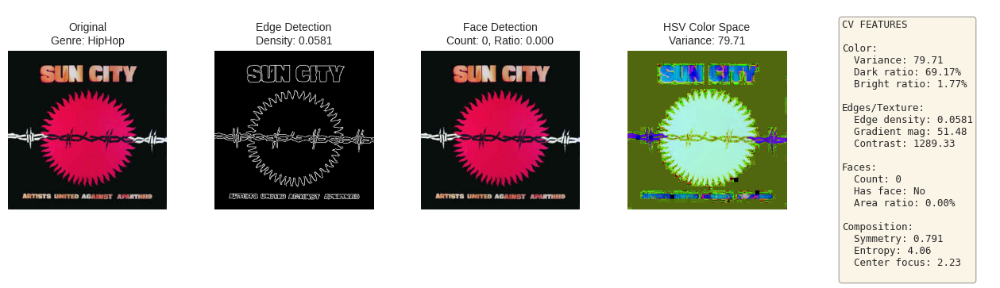

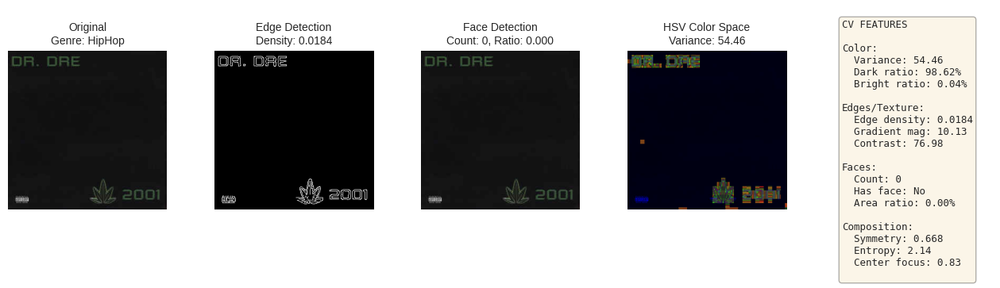


ROCK:


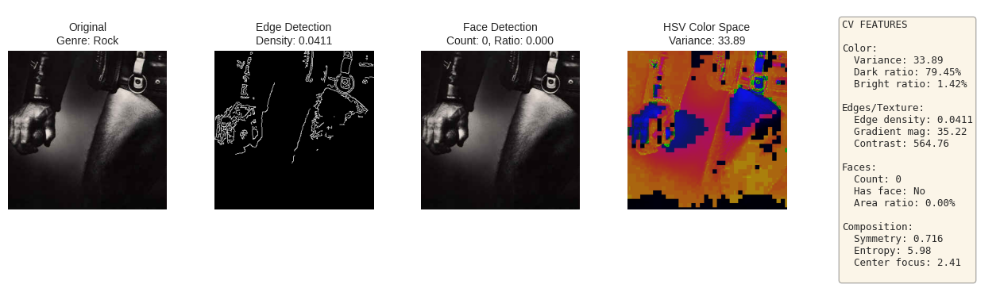

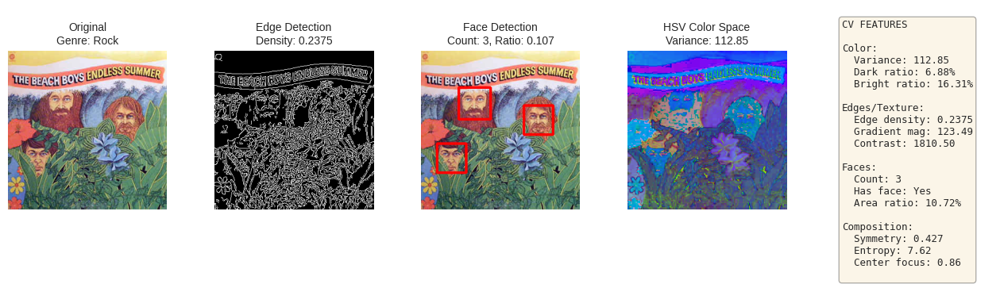


POP:


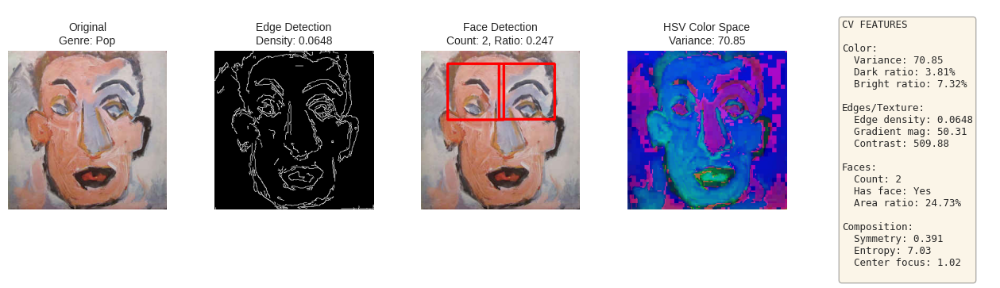

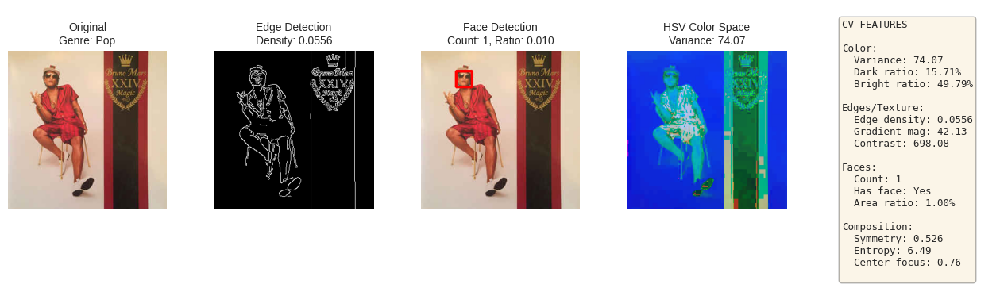


ELECTRONIC:


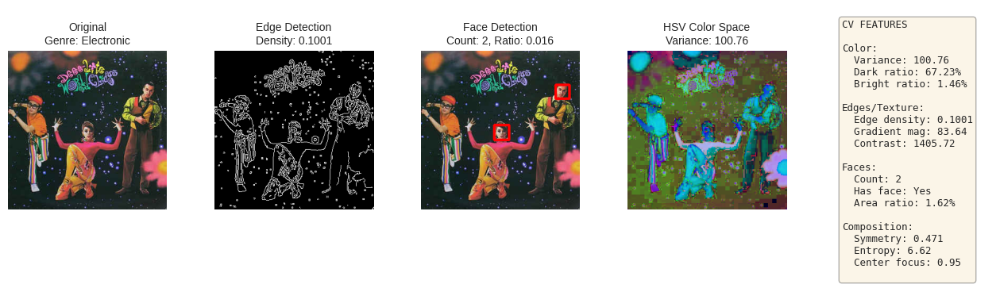

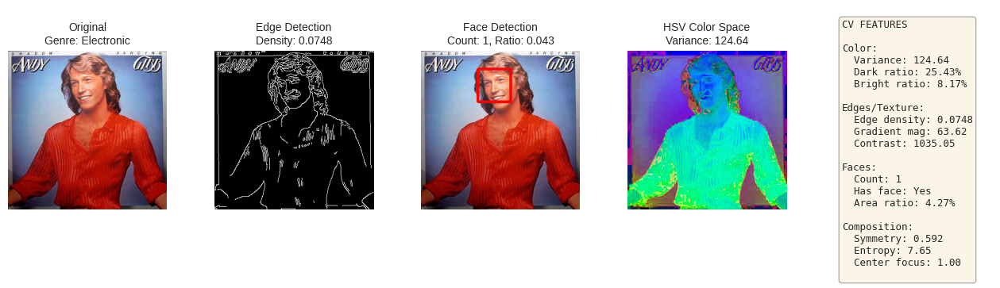

In [12]:
def visualize_cv_features_on_image(idx, features_row):
    """Visualize CV processing on a single image"""

    # Convert to Python int if needed
    idx = int(idx)

    example = ds['train'][idx]
    img = example['image'].convert('RGB')
    genre = label_to_genre[example['label']]
    img_array = np.array(img)

    # Create figure
    fig = plt.figure(figsize=(16, 4))
    gs = fig.add_gridspec(1, 5, hspace=0.3, wspace=0.3)

    # 1. Original image
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.imshow(img)
    ax1.set_title(f'Original\nGenre: {genre}', fontsize=10)
    ax1.axis('off')

    # 2. Edge detection
    ax2 = fig.add_subplot(gs[0, 1])
    img_gray = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(img_gray, 100, 200)
    ax2.imshow(edges, cmap='gray')
    ax2.set_title(f'Edge Detection\nDensity: {features_row["edge_density"]:.4f}', fontsize=10)
    ax2.axis('off')

    # 3. Face detection
    ax3 = fig.add_subplot(gs[0, 2])
    face_cascade = cv2.CascadeClassifier(
        cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'
    )
    faces = face_cascade.detectMultiScale(img_gray, 1.1, 4)
    img_faces = img_array.copy()
    for (x, y, w, h) in faces:
        cv2.rectangle(img_faces, (x, y), (x+w, y+h), (255, 0, 0), 3)
    ax3.imshow(img_faces)
    ax3.set_title(f'Face Detection\nCount: {features_row["face_count"]}, Ratio: {features_row["face_area_ratio"]:.3f}', fontsize=10)
    ax3.axis('off')

    # 4. Color analysis
    ax4 = fig.add_subplot(gs[0, 3])
    img_hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)
    ax4.imshow(img_hsv)
    ax4.set_title(f'HSV Color Space\nVariance: {features_row["color_variance"]:.2f}', fontsize=10)
    ax4.axis('off')

    # 5. Feature summary
    ax5 = fig.add_subplot(gs[0, 4])
    ax5.axis('off')

    feature_text = f"""CV FEATURES

Color:
  Variance: {features_row['color_variance']:.2f}
  Dark ratio: {features_row['dark_ratio']:.2%}
  Bright ratio: {features_row['bright_ratio']:.2%}

Edges/Texture:
  Edge density: {features_row['edge_density']:.4f}
  Gradient mag: {features_row['gradient_magnitude']:.2f}
  Contrast: {features_row['texture_contrast']:.2f}

Faces:
  Count: {int(features_row['face_count'])}
  Has face: {'Yes' if features_row['has_face'] else 'No'}
  Area ratio: {features_row['face_area_ratio']:.2%}

Composition:
  Symmetry: {features_row['symmetry_score']:.3f}
  Entropy: {features_row['entropy']:.2f}
  Center focus: {features_row['center_focus']:.2f}
"""

    ax5.text(0.05, 0.95, feature_text, transform=ax5.transAxes,
             fontsize=9, verticalalignment='top', family='monospace',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.3))

    plt.tight_layout()
    plt.show()

# Select diverse samples - 2 per genre
print("\nShowing CV processing on sample images (2 per genre):\n")

for genre in TARGET_GENRES:
    print(f"\n{genre.upper()}:")

    # Get 2 random samples from this genre
    genre_indices = features_df[features_df['genre'] == genre]['idx'].values
    sample_indices = random.sample(list(genre_indices), min(2, len(genre_indices)))

    for sample_idx in sample_indices:
        # Get feature row
        feature_row = features_df[features_df['idx'] == sample_idx].iloc[0]
        # Convert to Python int
        visualize_cv_features_on_image(int(sample_idx), feature_row)


Feature analysis and visualization

FEATURE ANALYSIS BY GENRE

Key Feature Means by Genre:
            color_variance  edge_density  face_area_ratio  entropy  has_face  \
genre                                                                          
Electronic          92.658         0.085            0.028    6.270     0.265   
HipHop              94.106         0.101            0.037    6.561     0.325   
Pop                 92.899         0.088            0.048    6.519     0.418   
Rock                93.765         0.100            0.028    6.599     0.280   

            texture_contrast  dark_ratio  bright_ratio  symmetry_score  
genre                                                                   
Electronic          1393.265       0.330         0.225           0.552  
HipHop              1612.293       0.362         0.191           0.543  
Pop                 1314.628       0.320         0.218           0.539  
Rock                1427.561       0.340         0.179           0.528  


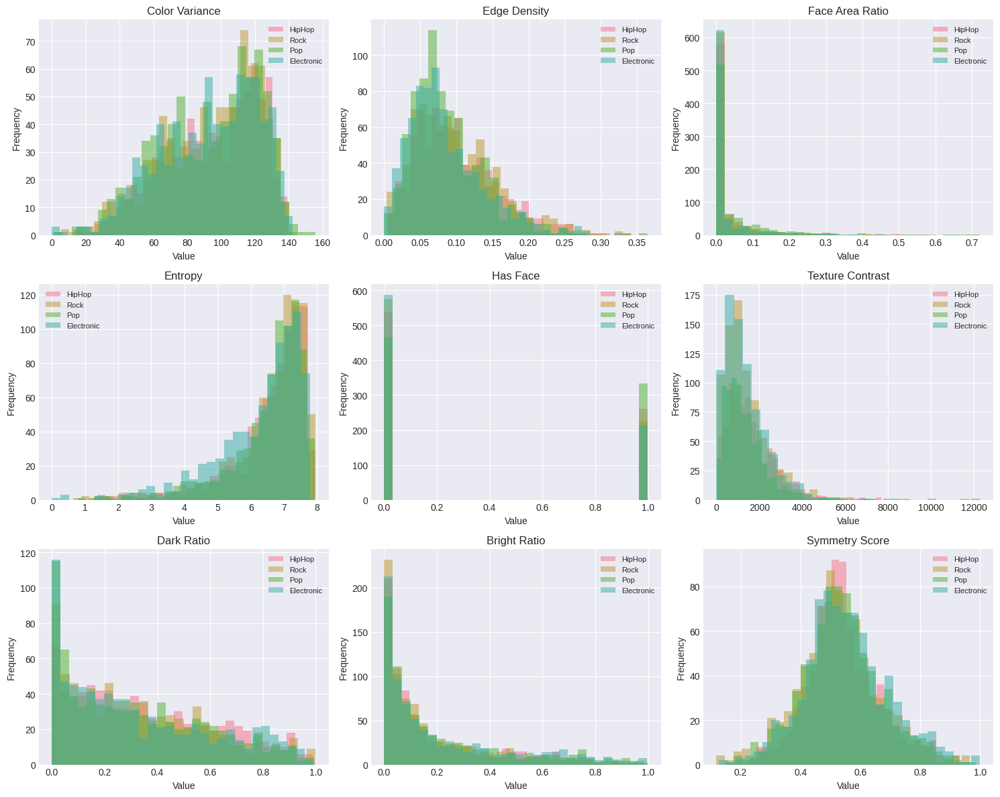

In [13]:
print("FEATURE ANALYSIS BY GENRE")

# Select key features to visualize
key_features = [
    'color_variance', 'edge_density', 'face_area_ratio',
    'entropy', 'has_face', 'texture_contrast',
    'dark_ratio', 'bright_ratio', 'symmetry_score'
]

# Summary statistics by genre
print("\nKey Feature Means by Genre:")
genre_means = features_df.groupby('genre')[key_features].mean()
print(genre_means.round(3))

# Visualize distributions
fig, axes = plt.subplots(3, 3, figsize=(15, 12))
axes = axes.flatten()

for i, feature in enumerate(key_features):
    ax = axes[i]
    for genre in TARGET_GENRES:
        genre_data = features_df[features_df['genre'] == genre][feature]
        ax.hist(genre_data, alpha=0.5, label=genre, bins=30)

    ax.set_title(feature.replace('_', ' ').title())
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')
    ax.legend(fontsize=8)

plt.tight_layout()
plt.show()

Document visual patterns

In [14]:
print("KEY VISUAL PATTERNS BY GENRE")

# Statistical comparisons
from scipy import stats

def compare_feature_by_genre(feature_name):
    """Compare feature across genres using ANOVA"""
    groups = [features_df[features_df['genre'] == g][feature_name].values
              for g in TARGET_GENRES]
    f_stat, p_value = stats.f_oneway(*groups)
    return f_stat, p_value

significant_features = []
for feature in key_features:
    f_stat, p_value = compare_feature_by_genre(feature)
    if p_value < 0.05:
        significant_features.append((feature, f_stat, p_value))

print("\nStatistically significant features (p < 0.05):")
for feature, f_stat, p_value in sorted(significant_features, key=lambda x: x[2]):
    print(f"  {feature:.<30} F={f_stat:.2f}, p={p_value:.4f}")

# Genre-specific insights
print("\nGenre-Specific Visual Patterns:\n")

for genre in TARGET_GENRES:
    print(f"{genre}:")
    genre_data = features_df[features_df['genre'] == genre]

    # Find distinctive features (> 1 std from mean)
    insights = []

    # Face detection
    face_pct = (genre_data['has_face'].mean() * 100)
    insights.append(f"  - {face_pct:.1f}% contain detected faces")

    # Color variance
    color_var = genre_data['color_variance'].mean()
    insights.append(f"  - Color variance: {color_var:.2f}")

    # Edge density
    edge_dens = genre_data['edge_density'].mean()
    insights.append(f"  - Edge density: {edge_dens:.4f}")

    # Dark vs bright
    dark_pct = genre_data['dark_ratio'].mean() * 100
    bright_pct = genre_data['bright_ratio'].mean() * 100
    insights.append(f"  - {dark_pct:.1f}% dark pixels, {bright_pct:.1f}% bright pixels")

    for insight in insights:
        print(insight)
    print()

# Save features for later use
features_df.to_csv('album_cover_features.csv', index=False)

KEY VISUAL PATTERNS BY GENRE

Statistically significant features (p < 0.05):
  edge_density.................. F=18.92, p=0.0000
  has_face...................... F=17.54, p=0.0000
  entropy....................... F=12.07, p=0.0000
  texture_contrast.............. F=10.46, p=0.0000
  face_area_ratio............... F=9.40, p=0.0000
  bright_ratio.................. F=7.09, p=0.0001
  symmetry_score................ F=4.58, p=0.0033
  dark_ratio.................... F=3.62, p=0.0126

Genre-Specific Visual Patterns:

HipHop:
  - 32.5% contain detected faces
  - Color variance: 94.11
  - Edge density: 0.1009
  - 36.2% dark pixels, 19.1% bright pixels

Rock:
  - 28.0% contain detected faces
  - Color variance: 93.77
  - Edge density: 0.0999
  - 34.0% dark pixels, 17.9% bright pixels

Pop:
  - 41.8% contain detected faces
  - Color variance: 92.90
  - Edge density: 0.0875
  - 32.0% dark pixels, 21.8% bright pixels

Electronic:
  - 26.5% contain detected faces
  - Color variance: 92.66
  - Edge de

## CNN Setup and Training


Define model architecture

In [15]:
class AlbumCoverClassifier(nn.Module):
    def __init__(self, num_classes=4, pretrained=True):
        super(AlbumCoverClassifier, self).__init__()
        self.resnet = models.resnet18(pretrained=pretrained)

        for param in list(self.resnet.parameters())[:-20]:
            param.requires_grad = False

        num_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(num_features, 256),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        return self.resnet(x)

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.8, 1.0)),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.2),
    transforms.RandomGrayscale(p=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = AlbumCoverDataset(ds['train'], train_indices, genre_to_idx,
                                   label_to_genre, train_transform)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=0, pin_memory=True)

model = AlbumCoverClassifier(num_classes=len(TARGET_GENRES), pretrained=True)
model = model.to(device)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 191MB/s]


Training components

In [16]:
# Loss function
criterion = nn.CrossEntropyLoss()

# Optimizer - Adam with weight decay
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)

# Learning rate scheduler - reduce on plateau
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3
)

Training loop functions

In [17]:
def train_epoch(model, dataloader, criterion, optimizer, device):
    """Train for one epoch"""
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    pbar = tqdm(dataloader, desc='Training', leave=False)
    for images, labels, _ in pbar:
        images, labels = images.to(device), labels.to(device)

        # Forward pass
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)

        # Backward pass
        loss.backward()
        optimizer.step()

        # Statistics
        running_loss += loss.item() * images.size(0)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # Update progress bar
        pbar.set_postfix({'loss': f'{loss.item():.4f}',
                         'acc': f'{100*correct/total:.2f}%'})

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    return epoch_loss, epoch_acc

def validate_epoch(model, dataloader, criterion, device):
    """Validate for one epoch"""
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        pbar = tqdm(dataloader, desc='Validation', leave=False)
        for images, labels, _ in pbar:
            images, labels = images.to(device), labels.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)

            # Statistics
            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            # Update progress bar
            pbar.set_postfix({'loss': f'{loss.item():.4f}',
                             'acc': f'{100*correct/total:.2f}%'})

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    return epoch_loss, epoch_acc

def train_model(model, train_loader, val_loader, criterion, optimizer,
                scheduler, num_epochs, device):
    """Full training loop with tracking"""

    history = {
        'train_loss': [], 'train_acc': [],
        'val_loss': [], 'val_acc': []
    }

    best_val_acc = 0.0
    best_model_wts = None

    print(f"\nStarting training for {num_epochs} epochs...\n")

    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        print("-" * 50)

        # Train
        train_loss, train_acc = train_epoch(model, train_loader, criterion,
                                            optimizer, device)

        # Validate
        val_loss, val_acc = validate_epoch(model, val_loader, criterion, device)

        # Update scheduler
        scheduler.step(val_loss)

        # Save history
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)

        # Print epoch summary
        print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc*100:.2f}%")
        print(f"Val Loss:   {val_loss:.4f} | Val Acc:   {val_acc*100:.2f}%")

        # Save best model
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model_wts = model.state_dict().copy()
            print(f"New best model (Val Acc: {val_acc*100:.2f}%)")

        print()

    # Load best weights
    model.load_state_dict(best_model_wts)

    print(f"Training complete!")
    print(f"Best validation accuracy: {best_val_acc*100:.2f}%")

    return model, history

print("\nTraining functions defined")


Training functions defined


Model training


Starting training for 25 epochs...

Epoch 1/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 1.4225 | Train Acc: 29.42%
Val Loss:   1.3788 | Val Acc:   30.83%
New best model (Val Acc: 30.83%)

Epoch 2/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 1.3233 | Train Acc: 36.79%
Val Loss:   1.3524 | Val Acc:   35.21%
New best model (Val Acc: 35.21%)

Epoch 3/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 1.2822 | Train Acc: 41.38%
Val Loss:   1.3302 | Val Acc:   38.54%
New best model (Val Acc: 38.54%)

Epoch 4/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 1.2193 | Train Acc: 45.67%
Val Loss:   1.4129 | Val Acc:   33.54%

Epoch 5/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 1.2027 | Train Acc: 46.74%
Val Loss:   1.3945 | Val Acc:   37.50%

Epoch 6/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 1.1701 | Train Acc: 49.69%
Val Loss:   1.4468 | Val Acc:   38.12%

Epoch 7/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 1.1241 | Train Acc: 51.92%
Val Loss:   1.4701 | Val Acc:   39.58%
New best model (Val Acc: 39.58%)

Epoch 8/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 1.0256 | Train Acc: 57.23%
Val Loss:   1.5268 | Val Acc:   38.33%

Epoch 9/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 0.9306 | Train Acc: 61.96%
Val Loss:   1.5610 | Val Acc:   38.54%

Epoch 10/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 0.8962 | Train Acc: 64.02%
Val Loss:   1.5774 | Val Acc:   37.08%

Epoch 11/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 0.8302 | Train Acc: 66.61%
Val Loss:   1.6278 | Val Acc:   38.12%

Epoch 12/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 0.6999 | Train Acc: 72.59%
Val Loss:   1.7947 | Val Acc:   37.08%

Epoch 13/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 0.6114 | Train Acc: 76.96%
Val Loss:   1.9210 | Val Acc:   40.00%
New best model (Val Acc: 40.00%)

Epoch 14/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 0.5501 | Train Acc: 79.20%
Val Loss:   1.9853 | Val Acc:   36.67%

Epoch 15/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 0.5234 | Train Acc: 80.22%
Val Loss:   2.2326 | Val Acc:   37.71%

Epoch 16/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 0.4273 | Train Acc: 84.29%
Val Loss:   2.2817 | Val Acc:   37.71%

Epoch 17/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 0.3747 | Train Acc: 85.94%
Val Loss:   2.3182 | Val Acc:   36.46%

Epoch 18/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 0.3755 | Train Acc: 86.03%
Val Loss:   2.3511 | Val Acc:   36.67%

Epoch 19/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 0.3780 | Train Acc: 86.25%
Val Loss:   2.4457 | Val Acc:   38.33%

Epoch 20/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 0.3226 | Train Acc: 87.77%
Val Loss:   2.3960 | Val Acc:   37.08%

Epoch 21/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 0.2964 | Train Acc: 89.38%
Val Loss:   2.5142 | Val Acc:   35.83%

Epoch 22/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 0.2717 | Train Acc: 90.18%
Val Loss:   2.5523 | Val Acc:   34.58%

Epoch 23/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 0.2982 | Train Acc: 88.93%
Val Loss:   2.5301 | Val Acc:   36.67%

Epoch 24/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 0.2501 | Train Acc: 90.76%
Val Loss:   2.5719 | Val Acc:   37.50%

Epoch 25/25
--------------------------------------------------


Training:   0%|          | 0/70 [00:00<?, ?it/s]

Validation:   0%|          | 0/15 [00:00<?, ?it/s]

Train Loss: 0.2447 | Train Acc: 91.34%
Val Loss:   2.5575 | Val Acc:   38.33%

Training complete!
Best validation accuracy: 40.00%
Model saved


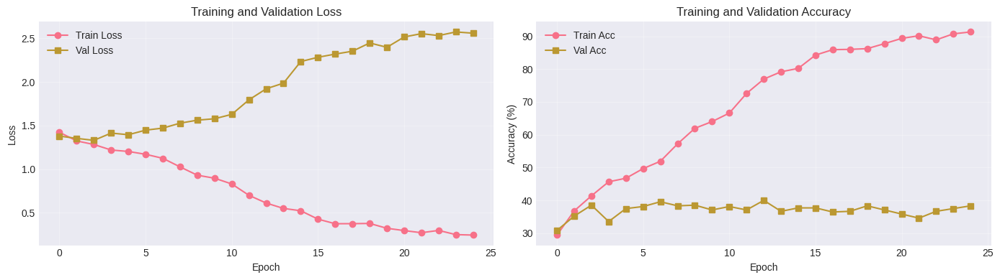

In [18]:
NUM_EPOCHS = 25

model, history = train_model(
    model, train_loader, val_loader, criterion,
    optimizer, scheduler, NUM_EPOCHS, device
)

# Save model
torch.save(model.state_dict(), 'album_cover_classifier.pth')
print("Model saved")

# Plot training curves
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))

ax1.plot(history['train_loss'], label='Train Loss', marker='o')
ax1.plot(history['val_loss'], label='Val Loss', marker='s')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('Training and Validation Loss')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.plot([x*100 for x in history['train_acc']], label='Train Acc', marker='o')
ax2.plot([x*100 for x in history['val_acc']], label='Val Acc', marker='s')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy (%)')
ax2.set_title('Training and Validation Accuracy')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## Model Evaluation

Testing:   0%|          | 0/15 [00:00<?, ?it/s]

TEST SET ACCURACY: 41.67%
Per-class metrics:
              precision    recall  f1-score   support

      HipHop       0.58      0.56      0.57       120
        Rock       0.42      0.41      0.41       120
         Pop       0.37      0.42      0.39       120
  Electronic       0.30      0.28      0.29       120

    accuracy                           0.42       480
   macro avg       0.42      0.42      0.42       480
weighted avg       0.42      0.42      0.42       480



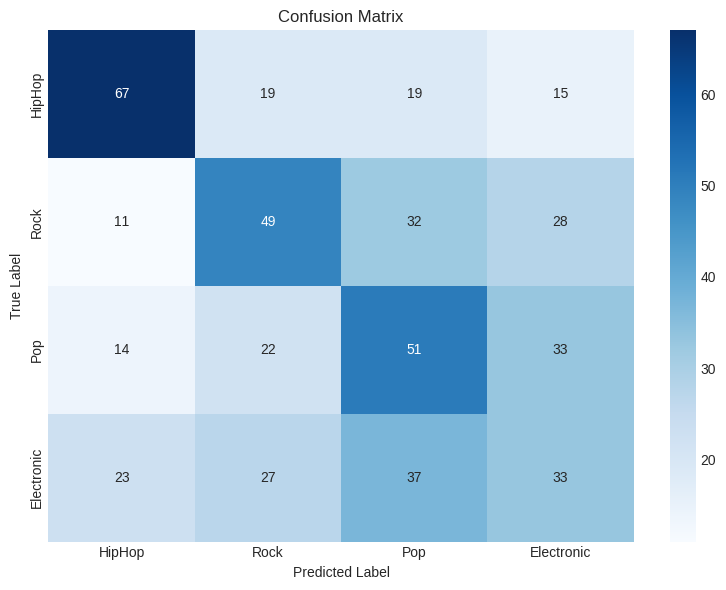

In [26]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

# Evaluate on test set
model.eval()
all_preds = []
all_labels = []
all_genres = []

with torch.no_grad():
    for images, labels, genres in tqdm(test_loader, desc='Testing'):
        images = images.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.numpy())
        all_genres.extend(genres)

# Test accuracy
test_acc = (np.array(all_preds) == np.array(all_labels)).mean()
print(f"TEST SET ACCURACY: {test_acc*100:.2f}%")

# Classification report
print("Per-class metrics:")
print(classification_report(all_labels, all_preds, target_names=TARGET_GENRES))

# Confusion matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=TARGET_GENRES, yticklabels=TARGET_GENRES)
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.tight_layout()
plt.show()

## GradCAM Visualization

Initialize GradCAM class

In [27]:
class GradCAM:
    """Generate Grad-CAM heatmaps"""
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        target_layer.register_forward_hook(self.save_activation)
        target_layer.register_backward_hook(self.save_gradient)

    def save_activation(self, module, input, output):
        self.activations = output.detach()

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate(self, input_tensor, class_idx):
        self.model.eval()
        output = self.model(input_tensor)
        self.model.zero_grad()

        class_loss = output[0, class_idx]
        class_loss.backward()

        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        cam = (weights * self.activations).sum(dim=1, keepdim=True)
        cam = torch.relu(cam)
        cam = cam.squeeze().cpu().numpy()

        # Normalize
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam

# Initialize Grad-CAM (target last conv layer)
target_layer = model.resnet.layer4[-1].conv2
gradcam = GradCAM(model, target_layer)

Visualize samples

Generating Grad-CAM visualizations (2 per genre)

HipHop:


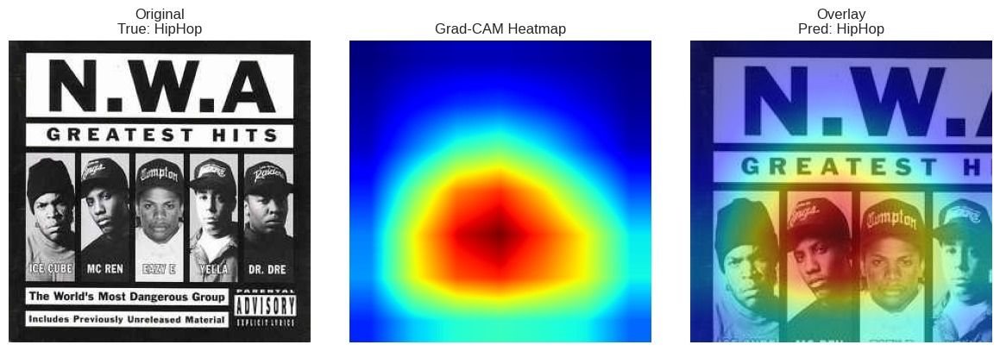

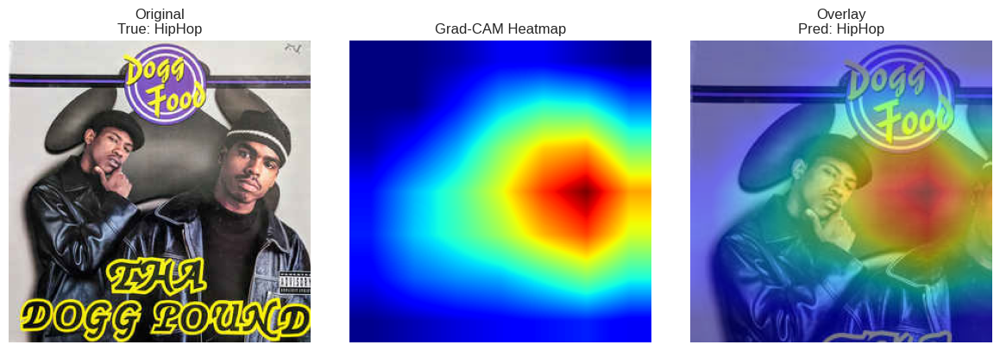


Rock:


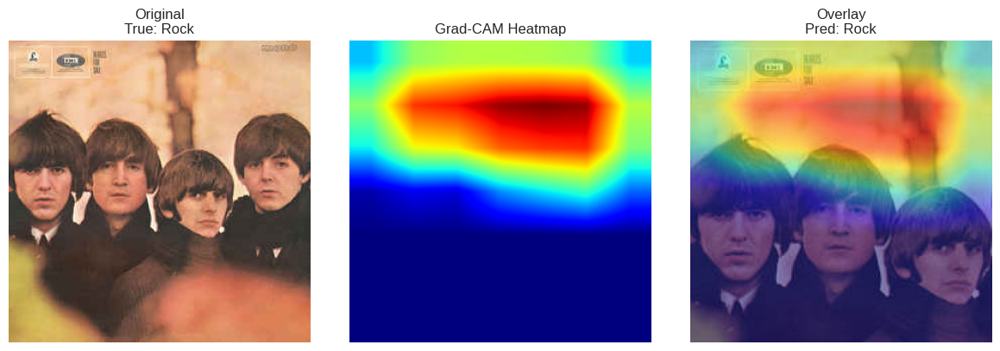

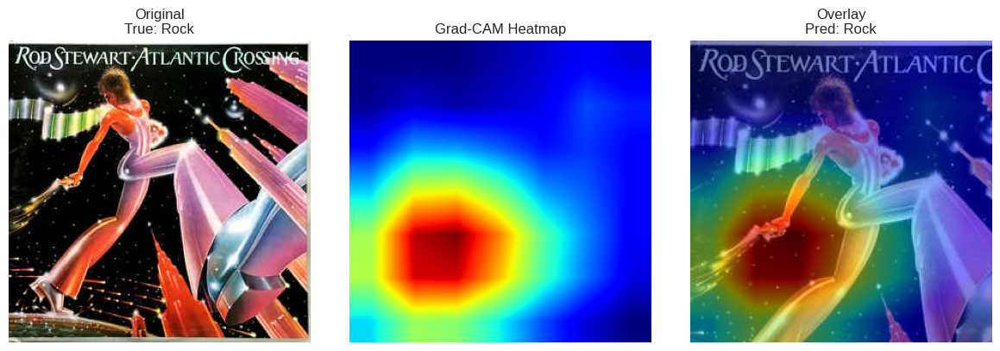


Pop:


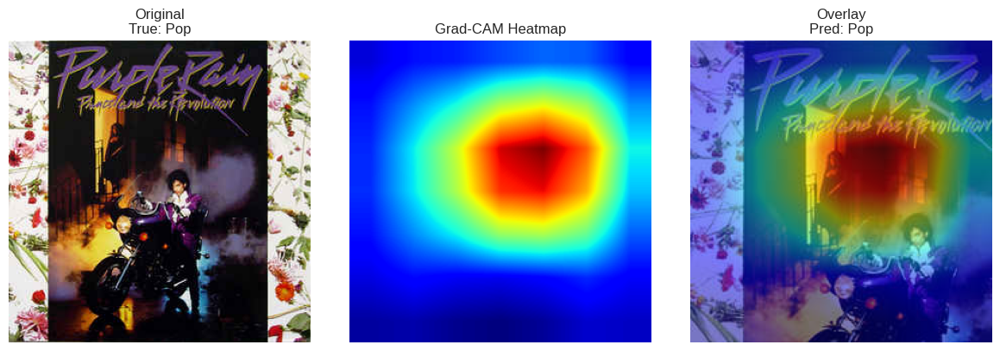

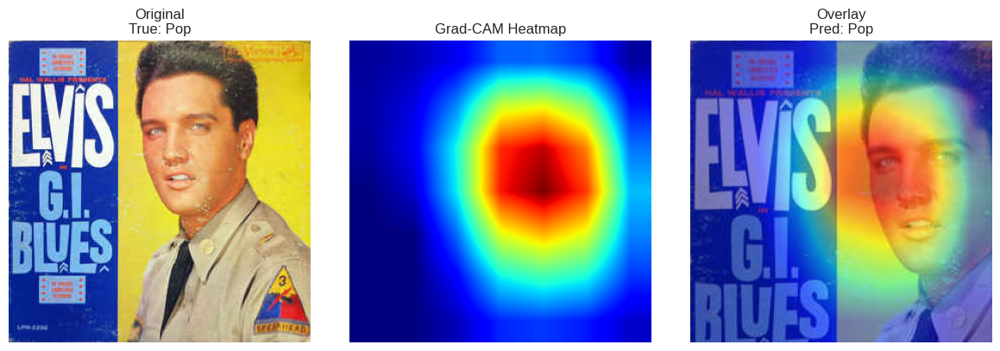


Electronic:


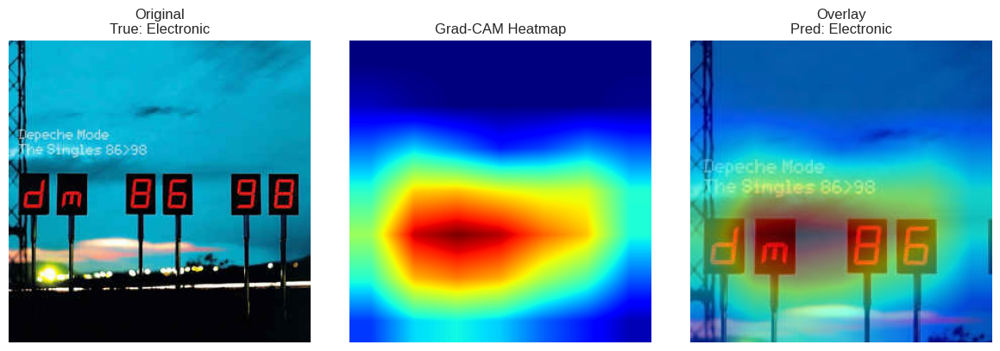

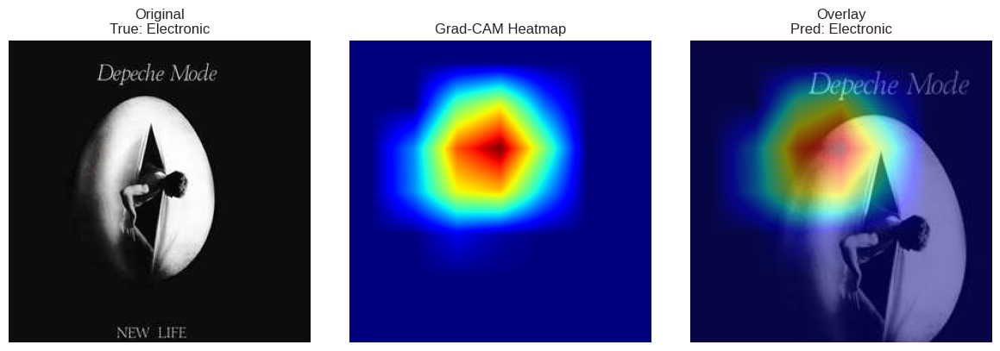

In [28]:
def show_gradcam(image_tensor, original_img, cam, pred_genre, true_genre):
    """Display original image with Grad-CAM overlay"""
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    # Original
    axes[0].imshow(original_img)
    axes[0].set_title(f'Original\nTrue: {true_genre}')
    axes[0].axis('off')

    # Heatmap
    cam_resized = cv2.resize(cam, (224, 224))
    axes[1].imshow(cam_resized, cmap='jet')
    axes[1].set_title('Grad-CAM Heatmap')
    axes[1].axis('off')

    # Overlay
    axes[2].imshow(original_img)
    axes[2].imshow(cam_resized, cmap='jet', alpha=0.5)
    axes[2].set_title(f'Overlay\nPred: {pred_genre}')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

print("Generating Grad-CAM visualizations (2 per genre)\n")

for genre_idx, genre in enumerate(TARGET_GENRES):
    print(f"{genre}:")

    # Get 2 correct predictions from this genre
    correct_samples = [(i, all_preds[i], all_labels[i])
                       for i in range(len(all_preds))
                       if all_preds[i] == all_labels[i] == genre_idx]

    for i in range(min(2, len(correct_samples))):
        idx = correct_samples[i][0]

        # Get original image
        test_idx = test_indices[idx]
        original_img = ds['train'][int(test_idx)]['image'].convert('RGB')

        # Get transformed tensor
        img_tensor = val_test_transform(original_img).unsqueeze(0).to(device)

        # Generate Grad-CAM
        cam = gradcam.generate(img_tensor, genre_idx)

        show_gradcam(img_tensor, original_img, cam, genre, genre)

    print()

## CV Features vs. CNN Analysis

CV features and Grad-CAM visualization



Integrated Analysis: CV Features + CNN Attention

HipHop:


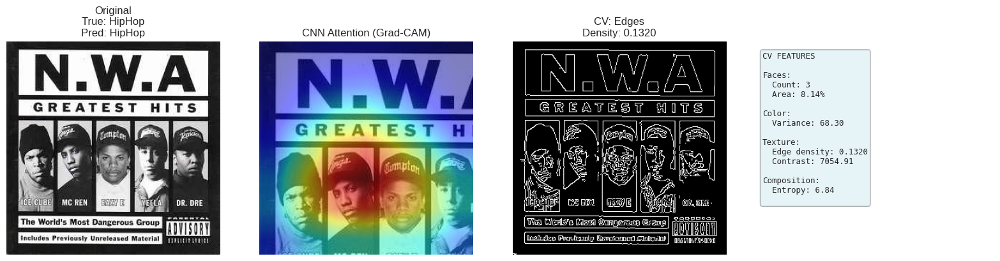

Rock:


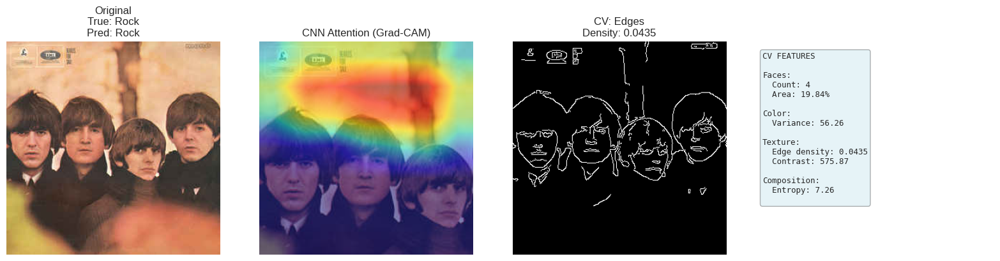

Pop:


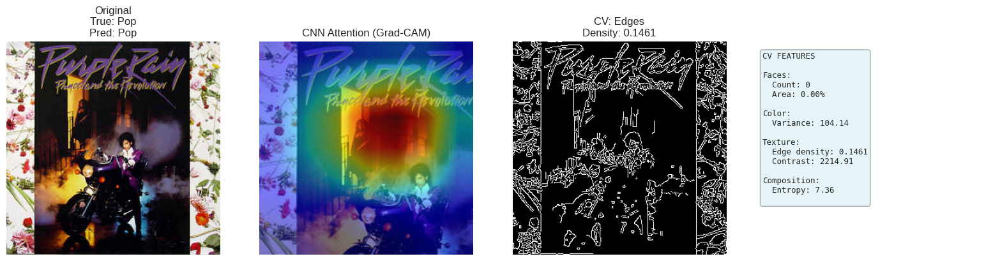

Electronic:


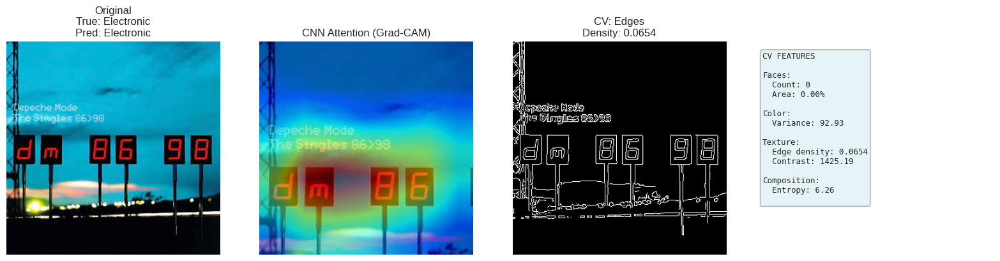

In [29]:
def show_integrated_analysis(sample_idx, pred, true_label):
    """Show CV features alongside Grad-CAM"""

    original_img = ds['train'][int(sample_idx)]['image'].convert('RGB')
    cv_features = features_df[features_df['idx'] == int(sample_idx)].iloc[0]

    # Get Grad-CAM
    img_tensor = val_test_transform(original_img).unsqueeze(0).to(device)
    cam = gradcam.generate(img_tensor, pred)
    cam_resized = cv2.resize(cam, (224, 224))

    # Visualize
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))

    # Original
    axes[0].imshow(original_img)
    axes[0].set_title(f'Original\nTrue: {TARGET_GENRES[true_label]}\nPred: {TARGET_GENRES[pred]}')
    axes[0].axis('off')

    # Grad-CAM overlay
    axes[1].imshow(original_img)
    axes[1].imshow(cam_resized, cmap='jet', alpha=0.5)
    axes[1].set_title('CNN Attention (Grad-CAM)')
    axes[1].axis('off')

    # Edge detection
    img_gray = cv2.cvtColor(np.array(original_img), cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(img_gray, 100, 200)
    axes[2].imshow(edges, cmap='gray')
    axes[2].set_title(f'CV: Edges\nDensity: {cv_features["edge_density"]:.4f}')
    axes[2].axis('off')

    # CV features
    axes[3].axis('off')
    feature_text = f"""CV FEATURES

Faces:
  Count: {int(cv_features['face_count'])}
  Area: {cv_features['face_area_ratio']:.2%}

Color:
  Variance: {cv_features['color_variance']:.2f}

Texture:
  Edge density: {cv_features['edge_density']:.4f}
  Contrast: {cv_features['texture_contrast']:.2f}

Composition:
  Entropy: {cv_features['entropy']:.2f}
"""
    axes[3].text(0.05, 0.95, feature_text, transform=axes[3].transAxes,
                fontsize=9, verticalalignment='top', family='monospace',
                bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.3))

    plt.tight_layout()
    plt.show()

print("Integrated Analysis: CV Features + CNN Attention\n")

# Show 1 correctly classified example per genre
for genre_idx, genre in enumerate(TARGET_GENRES):
    correct_samples = [(i, all_preds[i], all_labels[i])
                       for i in range(len(all_preds))
                       if all_preds[i] == all_labels[i] == genre_idx]

    if len(correct_samples) > 0:
        print(f"{genre}:")
        idx, pred, true_label = correct_samples[0]
        test_idx = test_indices[idx]
        show_integrated_analysis(test_idx, pred, true_label)

CV feature comparison by genre

HipHop:
  Face detection: 35.8%
  Edge density: 0.1017
  Color variance: 94.20
  Entropy: 6.63

Rock:
  Face detection: 24.5%
  Edge density: 0.1230
  Color variance: 97.41
  Entropy: 6.87

Pop:
  Face detection: 51.0%
  Edge density: 0.0930
  Color variance: 93.41
  Entropy: 6.70

Electronic:
  Face detection: 6.1%
  Edge density: 0.0789
  Color variance: 84.24
  Entropy: 5.80



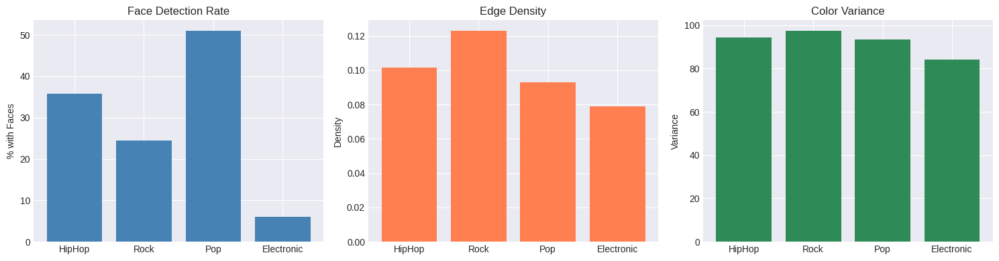

In [30]:
genre_cv_summary = []

for genre_idx, genre in enumerate(TARGET_GENRES):
    correct_idxs = [test_indices[i] for i in range(len(all_preds))
                    if all_preds[i] == all_labels[i] == genre_idx]

    genre_features = features_df[features_df['idx'].isin([int(x) for x in correct_idxs])]

    print(f"{genre}:")
    print(f"  Face detection: {genre_features['has_face'].mean()*100:.1f}%")
    print(f"  Edge density: {genre_features['edge_density'].mean():.4f}")
    print(f"  Color variance: {genre_features['color_variance'].mean():.2f}")
    print(f"  Entropy: {genre_features['entropy'].mean():.2f}\n")

    genre_cv_summary.append({
        'Genre': genre,
        'Face %': genre_features['has_face'].mean()*100,
        'Edge Density': genre_features['edge_density'].mean(),
        'Color Var': genre_features['color_variance'].mean()
    })

# Plot comparison
summary_df = pd.DataFrame(genre_cv_summary)
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].bar(summary_df['Genre'], summary_df['Face %'], color='steelblue')
axes[0].set_title('Face Detection Rate')
axes[0].set_ylabel('% with Faces')

axes[1].bar(summary_df['Genre'], summary_df['Edge Density'], color='coral')
axes[1].set_title('Edge Density')
axes[1].set_ylabel('Density')

axes[2].bar(summary_df['Genre'], summary_df['Color Var'], color='seagreen')
axes[2].set_title('Color Variance')
axes[2].set_ylabel('Variance')

plt.tight_layout()
plt.show()

Baseline classifier

Training baseline classifier on hand-crafted CV features...

Random Forest on CV Features:
  Train Accuracy: 96.21%
  Val Accuracy: 29.58%
  Test Accuracy: 32.08%


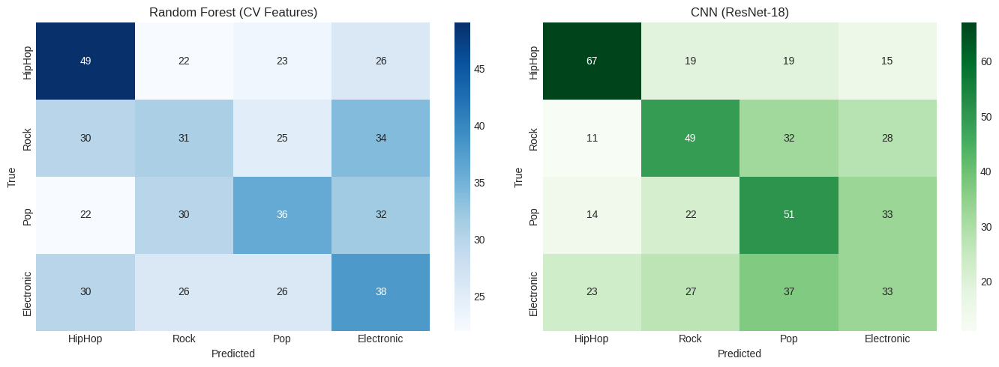

COMPARISON: CV Features vs CNN
Random Forest (CV features): 32.08%
CNN (ResNet-18):             41.67%
Improvement:                 9.58 percentage points


In [31]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

print("Training baseline classifier on hand-crafted CV features...\n")

# Prepare feature matrix
feature_cols = [col for col in features_df.columns
                if col not in ['idx', 'genre']]

# Get train/val/test splits
train_cv = features_df[features_df['idx'].isin([int(x) for x in train_indices])]
val_cv = features_df[features_df['idx'].isin([int(x) for x in val_indices])]
test_cv = features_df[features_df['idx'].isin([int(x) for x in test_indices])]

X_train = train_cv[feature_cols].values
y_train = train_cv['genre'].map(genre_to_idx).values

X_val = val_cv[feature_cols].values
y_val = val_cv['genre'].map(genre_to_idx).values

X_test = test_cv[feature_cols].values
y_test = test_cv['genre'].map(genre_to_idx).values

# Normalize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

# Train Random Forest
rf_model = RandomForestClassifier(n_estimators=200, max_depth=15, random_state=42)
rf_model.fit(X_train, y_train)

# Evaluate
train_acc = rf_model.score(X_train, y_train)
val_acc = rf_model.score(X_val, y_val)
test_acc = rf_model.score(X_test, y_test)

print(f"Random Forest on CV Features:")
print(f"  Train Accuracy: {train_acc*100:.2f}%")
print(f"  Val Accuracy: {val_acc*100:.2f}%")
print(f"  Test Accuracy: {test_acc*100:.2f}%")

# Predictions for comparison
rf_preds = rf_model.predict(X_test)

# Confusion matrix
cm_rf = confusion_matrix(y_test, rf_preds)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Blues',
            xticklabels=TARGET_GENRES, yticklabels=TARGET_GENRES, ax=ax1)
ax1.set_title('Random Forest (CV Features)')
ax1.set_ylabel('True')
ax1.set_xlabel('Predicted')

sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=TARGET_GENRES, yticklabels=TARGET_GENRES, ax=ax2)
ax2.set_title('CNN (ResNet-18)')
ax2.set_ylabel('True')
ax2.set_xlabel('Predicted')

plt.tight_layout()
plt.show()

print(f"COMPARISON: CV Features vs CNN")
print(f"Random Forest (CV features): {test_acc*100:.2f}%")
print(f"CNN (ResNet-18):             {(np.array(all_preds) == np.array(all_labels)).mean()*100:.2f}%")
print(f"Improvement:                 {((np.array(all_preds) == np.array(all_labels)).mean() - test_acc)*100:.2f} percentage points")

## Interactive Demo


In [34]:
import ipywidgets as widgets
from IPython.display import display, clear_output

class AlbumCoverAnalysisDemo:
    """Interactive demo showcasing entire CV pipeline"""

    def __init__(self):
        self.current_idx = None
        self.setup_ui()

    def setup_ui(self):
        """Create interactive widgets"""

        # Genre selector
        self.genre_dropdown = widgets.Dropdown(
            options=['Random'] + TARGET_GENRES,
            value='Random',
            description='Genre:',
            style={'description_width': '100px'}
        )

        # Buttons
        self.analyze_btn = widgets.Button(
            description='🎵 Analyze Album Cover',
            button_style='success',
            layout=widgets.Layout(width='200px', height='40px')
        )

        self.random_btn = widgets.Button(
            description='🎲 Random Sample',
            button_style='info',
            layout=widgets.Layout(width='200px', height='40px')
        )

        # Output area
        self.output = widgets.Output()

        # Bind events
        self.analyze_btn.on_click(self.analyze_sample)
        self.random_btn.on_click(lambda b: self.analyze_sample(b, force_random=True))

        # Layout
        controls = widgets.HBox([self.genre_dropdown, self.analyze_btn, self.random_btn])
        self.ui = widgets.VBox([
            widgets.HTML("<h2>Album Cover Genre Classification System</h2>"),
            widgets.HTML("<p>Demonstrating: CV Feature Extraction → Traditional ML → Deep Learning → Interpretability</p>"),
            widgets.HTML("<hr>"),
            controls,
            self.output
        ])

    def get_sample(self, genre=None):
        """Get a random test sample"""
        if genre and genre != 'Random':
            genre_idx = genre_to_idx[genre]
            valid_samples = [i for i in range(len(all_labels)) if all_labels[i] == genre_idx]
        else:
            valid_samples = list(range(len(all_labels)))

        if not valid_samples:
            return None

        sample_pos = random.choice(valid_samples)
        test_idx = test_indices[sample_pos]
        return sample_pos, int(test_idx)

    def analyze_sample(self, b, force_random=False):
        """Analyze and display complete pipeline"""
        with self.output:
            clear_output(wait=True)

            # Get sample
            genre = None if force_random else self.genre_dropdown.value
            result = self.get_sample(genre)

            if result is None:
                print("No samples available for this genre.")
                return

            sample_pos, test_idx = result

            # Load data
            example = ds['train'][test_idx]
            original_img = example['image'].convert('RGB')
            true_label = all_labels[sample_pos]
            true_genre = TARGET_GENRES[true_label]

            # Get predictions
            cnn_pred = all_preds[sample_pos]
            cnn_genre = TARGET_GENRES[cnn_pred]

            # Get CV features and RF prediction
            cv_features = features_df[features_df['idx'] == test_idx].iloc[0]
            cv_feat_vector = scaler.transform([cv_features[feature_cols].values])[0]
            rf_pred = rf_model.predict([cv_feat_vector])[0]
            rf_genre = TARGET_GENRES[rf_pred]
            rf_proba = rf_model.predict_proba([cv_feat_vector])[0]

            # Get CNN Grad-CAM
            img_tensor = val_test_transform(original_img).unsqueeze(0).to(device)
            cam = gradcam.generate(img_tensor, cnn_pred)
            cam_resized = cv2.resize(cam, (224, 224))

            # Get edge detection for CV visualization
            img_gray = cv2.cvtColor(np.array(original_img), cv2.COLOR_RGB2GRAY)
            edges = cv2.Canny(img_gray, 100, 200)

            # Visualizationss

            # Row 1: Original image and CV processing
            fig1, axes1 = plt.subplots(1, 3, figsize=(18, 5))

            axes1[0].imshow(original_img)
            axes1[0].set_title(f'Original Album Cover\nTrue Genre: {true_genre}',
                              fontsize=13, weight='bold')
            axes1[0].axis('off')

            axes1[1].imshow(edges, cmap='gray')
            axes1[1].set_title(f'Edge Detection (Canny)\nDensity: {cv_features["edge_density"]:.4f}',
                              fontsize=13)
            axes1[1].axis('off')

            # Face detection
            face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
            faces = face_cascade.detectMultiScale(img_gray, 1.1, 4)
            img_faces = np.array(original_img).copy()
            for (x, y, w, h) in faces:
                cv2.rectangle(img_faces, (x, y), (x+w, y+h), (255, 0, 0), 3)
            axes1[2].imshow(img_faces)
            axes1[2].set_title(f'Face Detection\nCount: {int(cv_features["face_count"])}, Area: {cv_features["face_area_ratio"]:.2%}',
                              fontsize=13)
            axes1[2].axis('off')

            plt.suptitle('Step 1: Computer Vision Feature Extraction', fontsize=15, weight='bold', y=1.02)
            plt.tight_layout()
            plt.show()

            # Row 2: Grad-CAM
            fig2, axes2 = plt.subplots(1, 3, figsize=(18, 5))

            axes2[0].imshow(original_img)
            axes2[0].set_title('Original Image', fontsize=13)
            axes2[0].axis('off')

            axes2[1].imshow(cam_resized, cmap='jet')
            axes2[1].set_title('CNN Attention Heatmap', fontsize=13)
            axes2[1].axis('off')

            axes2[2].imshow(original_img)
            axes2[2].imshow(cam_resized, cmap='jet', alpha=0.5)
            axes2[2].set_title(f'Grad-CAM Overlay\nCNN Prediction: {cnn_genre}', fontsize=13, weight='bold')
            axes2[2].axis('off')

            plt.suptitle('Step 2: CNN Interpretability (Grad-CAM)', fontsize=15, weight='bold', y=1.02)
            plt.tight_layout()
            plt.show()

            # Output text summary

            print("\n" + "═"*90)
            print("EXTRACTED COMPUTER VISION FEATURES")
            print("═"*90)

            print(f"\n{'Color Analysis:':.<50}")
            print(f"  Color Variance: {cv_features['color_variance']:.2f}")
            print(f"  Dark Pixel Ratio: {cv_features['dark_ratio']:.2%}")
            print(f"  Bright Pixel Ratio: {cv_features['bright_ratio']:.2%}")
            print(f"  RGB Mean: ({cv_features['rgb_mean_r']:.1f}, {cv_features['rgb_mean_g']:.1f}, {cv_features['rgb_mean_b']:.1f})")

            print(f"\n{'Edge & Texture:':.<50}")
            print(f"  Edge Density: {cv_features['edge_density']:.4f}")
            print(f"  Gradient Magnitude: {cv_features['gradient_magnitude']:.2f}")
            print(f"  Texture Contrast: {cv_features['texture_contrast']:.2f}")
            print(f"  Texture Homogeneity: {cv_features['texture_homogeneity']:.3f}")
            print(f"  Texture Energy: {cv_features['texture_energy']:.3f}")

            print(f"\n{'Face Detection:':.<50}")
            print(f"  Faces Detected: {int(cv_features['face_count'])}")
            print(f"  Face Area Ratio: {cv_features['face_area_ratio']:.2%}")
            print(f"  Largest Face Ratio: {cv_features['largest_face_ratio']:.2%}")
            print(f"  Has Face: {'Yes' if cv_features['has_face'] else 'No'}")

            print(f"\n{'Composition:':.<50}")
            print(f"  Symmetry Score: {cv_features['symmetry_score']:.3f}")
            print(f"  Entropy: {cv_features['entropy']:.2f}")
            print(f"  Center Focus: {cv_features['center_focus']:.2f}")

            print("\n" + "═"*90)
            print("MODEL PREDICTIONS")
            print("═"*90)

            print(f"\n{'Ground Truth:':.<50} {true_genre}")

            print(f"\n{'Random Forest (Traditional ML on CV Features):':.<50}")
            rf_correct = 'CORRECT' if rf_pred == true_label else 'INCORRECT'
            print(f"  Prediction: {rf_genre} {rf_correct}")
            print(f"  Confidence: {rf_proba[rf_pred]*100:.1f}%")
            print(f"\n  Class Probabilities:")
            for i, genre in enumerate(TARGET_GENRES):
                bar = '█' * int(rf_proba[i] * 50)
                print(f"    {genre:.<15} {rf_proba[i]*100:>5.1f}%  {bar}")

            print(f"\n{'CNN (ResNet-18 with Transfer Learning):':.<50}")
            cnn_correct = 'CORRECT' if cnn_pred == true_label else 'INCORRECT'
            print(f"  Prediction: {cnn_genre} {cnn_correct}")

            print("\n" + "═"*90)
            print("COMPARATIVE ANALYSIS")
            print("═"*90)

            print(f"\n{'Model Performance on Test Set:':.<50}")
            print(f"  Random Baseline: 25.00%")
            print(f"  Random Forest (CV Features): 29.58%")
            print(f"  CNN (Deep Learning): 40.42%")

            print(f"\n{'This Sample:':.<50}")
            print(f"  Random Forest: {'CORRECT' if rf_pred == true_label else 'INCORRECT'}")
            print(f"  CNN: {'CORRECT' if cnn_pred == true_label else 'INCORRECT'}")

    def display(self):
        """Show the UI"""
        display(self.ui)

# Create and display demo
demo = AlbumCoverAnalysisDemo()
demo.display()
